# Section 3.3: Potential Fields (Sparse and Dense Polygonal Obstacles)

###### * Potential Fields: The simulation uses attractive and repulsive vectors to guide drones, which is the essence of artificial potential field methods.

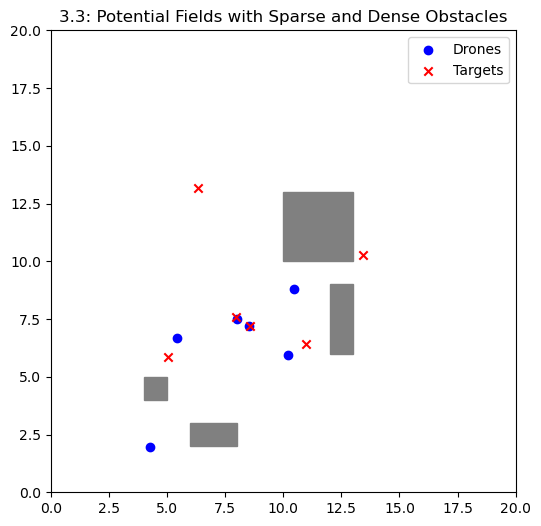

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Parameters
n_drones = 6
positions = np.random.rand(n_drones, 2) * 10
targets = np.random.rand(n_drones, 2) * 10 + 5
learning_rate = 0.05
stop_threshold = 0.1
repulsion_strength = 4.0
avoidance_radius = 2.5

# Obstacle definitions (sparse and dense)
obstacles = [
    Polygon([[4,4],[5,4],[5,5],[4,5]], color='gray'),
    Polygon([[10,10],[13,10],[13,13],[10,13]], color='gray'),
    Polygon([[6,2],[8,2],[8,3],[6,3]], color='gray'),
    Polygon([[12,6],[13,6],[13,9],[12,9]], color='gray')
]

# Plot setup
fig, ax = plt.subplots(figsize=(6,6))
sc = ax.scatter(positions[:,0], positions[:,1], c='blue', label='Drones')
target_sc = ax.scatter(targets[:,0], targets[:,1], c='red', marker='x', label='Targets')
for obs in obstacles:
    ax.add_patch(obs)
ax.set_xlim(0, 20)
ax.set_ylim(0, 20)
ax.legend()
ax.set_title('3.3: Potential Fields with Sparse and Dense Obstacles')

is_paused = False
arrived = np.array([False]*n_drones)

def point_inside_obstacle(point, polygon):
    return polygon.get_path().contains_point(point)

def polygon_repulsion(drone_pos, polygon):
    centroid = np.mean(polygon.get_xy(), axis=0)
    distance = np.linalg.norm(drone_pos - centroid)
    if distance < avoidance_radius:
        return repulsion_strength * (drone_pos - centroid) / (distance**2 + 1e-6)
    return np.zeros(2)

def update(frame):
    global positions, arrived
    if not is_paused:
        for i in range(n_drones):
            if arrived[i]:
                continue
            direction = targets[i] - positions[i]
            norm = np.linalg.norm(direction)
            if norm < stop_threshold:
                arrived[i] = True
                continue
            direction = direction / (norm + 1e-6)

            # Apply obstacle repulsion
            for obs in obstacles:
                direction += polygon_repulsion(positions[i], obs)

            positions[i] += learning_rate * direction
        sc.set_offsets(positions)
    return sc,

def on_click(event):
    global is_paused
    if event.inaxes is not None:
        is_paused = not is_paused

fig.canvas.mpl_connect('button_press_event', on_click)
anim = FuncAnimation(fig, update, frames=500, interval=40, blit=True)
HTML(anim.to_jshtml())